In [1]:
!pip install diffusers transformers fastcore

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 229 kB 27.3 MB/s 
     |████████████████████████████████| 5.3 MB 66.8 MB/s 
     |████████████████████████████████| 163 kB 66.2 MB/s 
     |████████████████████████████████| 7.6 MB 56.0 MB/s 


In [2]:
from PIL import Image
from fastcore.all import concat
import torch, logging
from pathlib import Path
from huggingface_hub import notebook_login
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

Login successful
Your token has been saved to /root/.huggingface/token


In [3]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

In [4]:
prompt = "a photograph of an astronaut on a skateboard"

  0%|          | 0/51 [00:00<?, ?it/s]

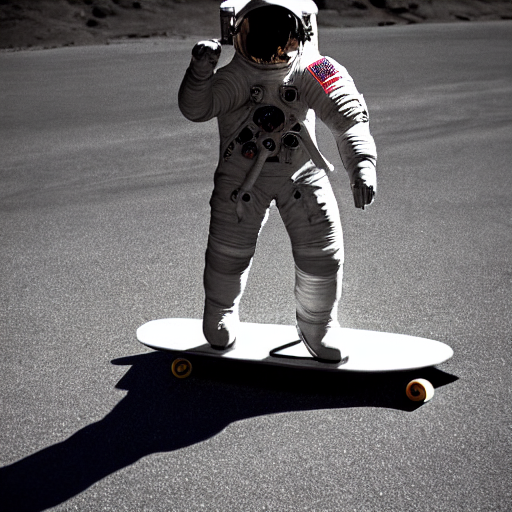

In [5]:
torch.manual_seed(123)
pipe(prompt).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

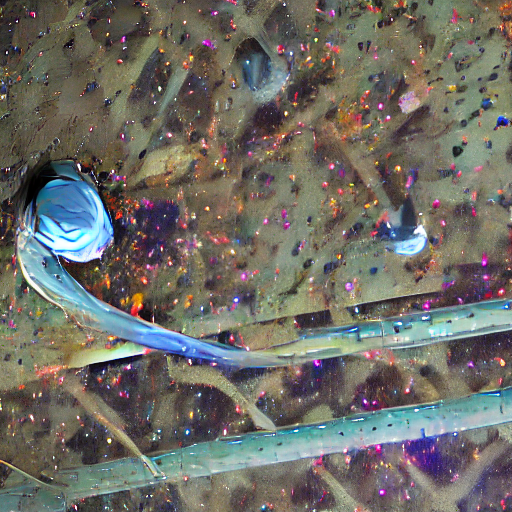

In [6]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/6 [00:00<?, ?it/s]

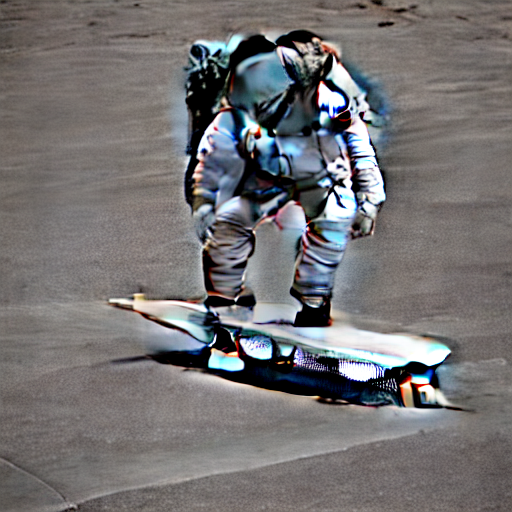

In [7]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=5).images[0]

  0%|          | 0/17 [00:00<?, ?it/s]

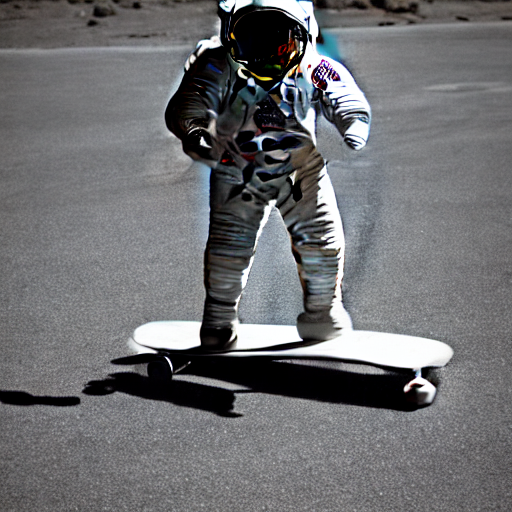

In [8]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=16).images[0]

In [9]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

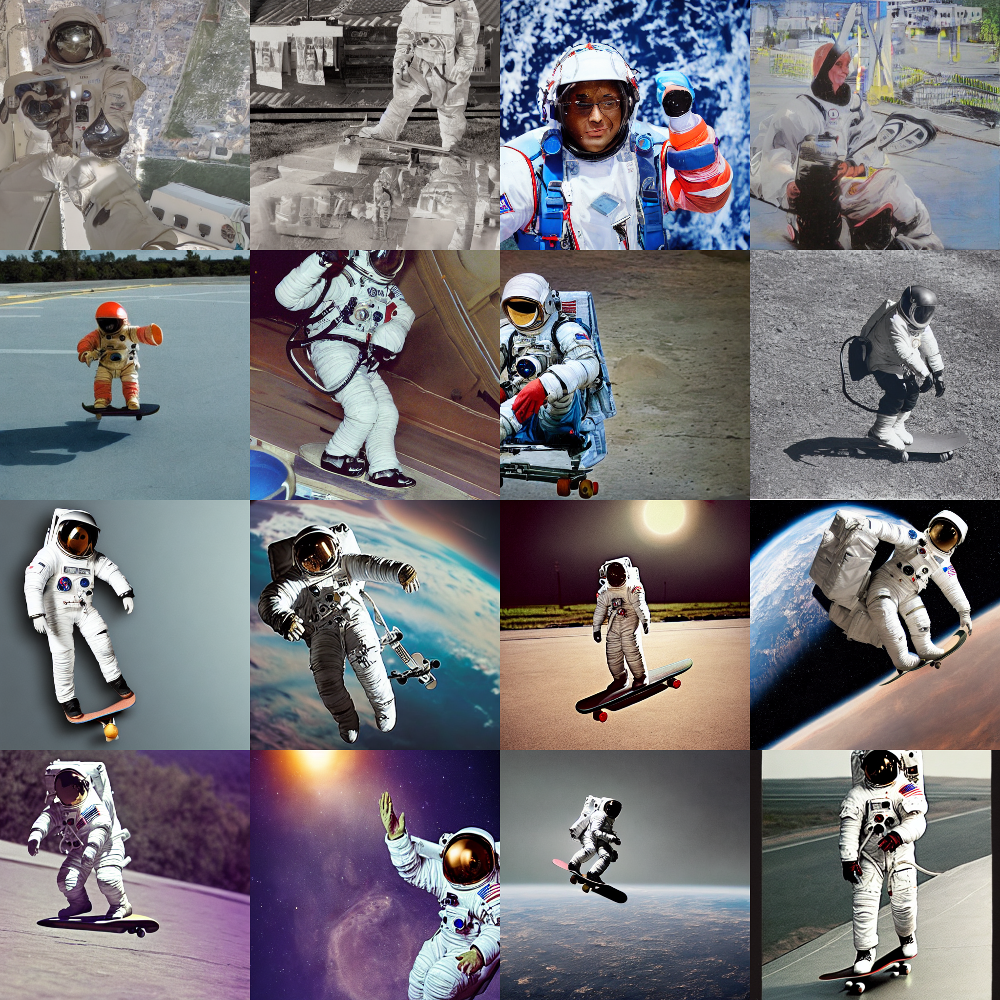

In [10]:
num_rows, num_cols = 4, 4
prompts = [prompt] * num_cols
images = concat(pipe(prompts, guidance_scale=g).images for g in [1, 3, 7, 10, 14])
image_grid(images, rows=num_rows, cols=num_cols)

  0%|          | 0/51 [00:00<?, ?it/s]

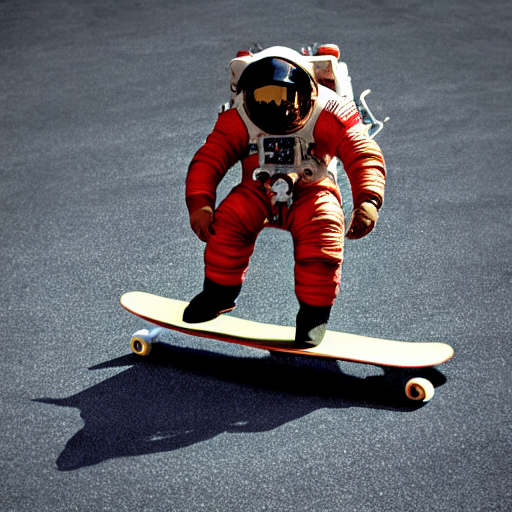

In [11]:
torch.manual_seed(123)
pipe(prompt, negative_prompt="white").images[0]